# Can we Determine the Variables that Influence Confirmed Disposition of Exoplanets?
#### by Zachary Ciolino, Grace Morgan, Austin Taylor, Juliana White

# Framing the Problem
## An exoplanet is any planet beyond our solar system
Its not a simple process to identify or catalog exoplanets. Even with high powered scopes, there has not been many exoplanet observed directly. Most of them are detected indirectly via astronomical data.

We want to see if we have the ability to confirm planet's dispositionwith other data not typically used by NASA.

## Why we care
Exoplanet Exploration is important because it is the process in which we can start to identify "Earth-like" planets. From identifying these planets, we can start to search for habitable planets and for life outside of our solar system. This also leads into the planning of future missions as our knowledge of space evolves.

In [1]:
#import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pydotplus
import io
from scipy import misc
from IPython.display import Image

from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree, metrics, preprocessing
from sklearn.metrics import accuracy_score, confusion_matrix, r2_score, mean_squared_error
from sklearn.tree import export_graphviz
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.externals.six import StringIO
from sklearn.linear_model import LogisticRegression

from sklearn.tree import export_graphviz

## How Success will be measured
We determine success by the accuracy of our model which is the hitrate of the Random Forest of variables not typically used by NASA to build it.

# Assumptions:
## Decision Tree and Random Forest
No formal assumptions are required for Decision Tree and Random Forest
## Logistic Regression
1.) Observations are independent of each other

2.) Little or No Multicollinearity among independent variables

3.) Independent Variables are linearly related to the log of odds

4.) Dependent Variable is binary

5.) Large Amount of Observations

# Data
NASA Kepler Objects of Interest Data Set

A Kepler object of interest (KOI) is a star observed by the Kepler space telescope that is suspected of hosting one or more transiting planets

In [2]:
#load data
data = pd.read_csv('cumulative_2020.07.07_13.36.50.csv')
data.head()

,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,10811496,K00753.01,NaN,CANDIDATE,CANDIDATE,0.000,0,0,0,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 49 columns):
kepid                9564 non-null int64
kepoi_name           9564 non-null object
kepler_name          2308 non-null object
koi_disposition      9564 non-null object
koi_pdisposition     9564 non-null object
koi_score            8054 non-null float64
koi_fpflag_nt        9564 non-null int64
koi_fpflag_ss        9564 non-null int64
koi_fpflag_co        9564 non-null int64
koi_fpflag_ec        9564 non-null int64
koi_period           9564 non-null float64
koi_period_err1      9110 non-null float64
koi_period_err2      9110 non-null float64
koi_time0bk          9564 non-null float64
koi_time0bk_err1     9110 non-null float64
koi_time0bk_err2     9110 non-null float64
koi_impact           9201 non-null float64
koi_impact_err1      9110 non-null float64
koi_impact_err2      9110 non-null float64
koi_duration         9564 non-null float64
koi_duration_err1    9110 non-null float64
koi_

## Wrangle Data

In [4]:
#make dummy variable for our target
data = pd.get_dummies(data, columns = ['koi_disposition'])
data = data.rename(columns ={"koi_disposition_CONFIRMED":"Confirmed"})
data = data.rename(columns ={"koi_disposition_CANDIDATE":"Candidate"})
data.head()

,kepid,kepoi_name,kepler_name,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,...,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag,Candidate,Confirmed,koi_disposition_FALSE POSITIVE
0,10797460,K00752.01,Kepler-227 b,CANDIDATE,1.000,0,0,0,0,9.488036,...,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347,0,1,0
1,10797460,K00752.02,Kepler-227 c,CANDIDATE,0.969,0,0,0,0,54.418383,...,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347,0,1,0
2,10811496,K00753.01,NaN,CANDIDATE,0.000,0,0,0,0,19.899140,...,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436,1,0,0
3,10848459,K00754.01,NaN,FALSE POSITIVE,0.000,0,1,0,0,1.736952,...,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597,0,0,1
4,10854555,K00755.01,Kepler-664 b,CANDIDATE,1.000,0,0,0,0,2.525592,...,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509,0,1,0


In [5]:
#remove candidate rows
dat = data[data['Candidate']==0]

In [6]:
dat.shape

(7146, 51)

In [7]:
#look at % missing null values
dat.isnull().sum()/len(dat)*100

kepid                               0.000000
kepoi_name                          0.000000
kepler_name                        67.702211
koi_pdisposition                    0.000000
koi_score                          12.678421
koi_fpflag_nt                       0.000000
koi_fpflag_ss                       0.000000
koi_fpflag_co                       0.000000
koi_fpflag_ec                       0.000000
koi_period                          0.000000
koi_period_err1                     4.673943
koi_period_err2                     4.673943
koi_time0bk                         0.000000
koi_time0bk_err1                    4.673943
koi_time0bk_err2                    4.673943
koi_impact                          3.610411
koi_impact_err1                     4.673943
koi_impact_err2                     4.673943
koi_duration                        0.000000
koi_duration_err1                   4.673943
koi_duration_err2                   4.673943
koi_depth                           3.610411
koi_depth_

In [8]:
# use numeric data not pertaining to flag, err or score 
# the above varaibles are the only NASA used to determain 'Confirmed'
# we want to see if we can determine confirmed with the other data
# remove columns with missing values over 20%
df = dat[['Confirmed','koi_kepmag','dec','ra','koi_srad','koi_slogg','koi_steff','koi_model_snr','koi_insol','koi_teq','koi_prad','koi_depth','koi_duration','koi_impact','koi_time0bk','koi_period']]
df.head()

,Confirmed,koi_kepmag,dec,ra,koi_srad,koi_slogg,koi_steff,koi_model_snr,koi_insol,koi_teq,koi_prad,koi_depth,koi_duration,koi_impact,koi_time0bk,koi_period
0,1,15.347,48.141651,291.93423,0.927,4.467,5455.0,35.8,93.59,793.0,2.26,616.0,2.95750,0.146,170.538750,9.488036
1,1,15.347,48.141651,291.93423,0.927,4.467,5455.0,25.8,9.11,443.0,2.83,875.0,4.50700,0.586,162.513840,54.418383
3,0,15.597,48.285210,285.53461,0.791,4.564,5805.0,505.6,891.96,1395.0,33.46,8080.0,2.40641,1.276,170.307565,1.736952
4,1,15.509,48.226200,288.75488,1.046,4.438,6031.0,40.9,926.16,1406.0,2.75,603.0,1.65450,0.701,171.595550,2.525592
5,1,15.714,48.224670,296.28613,0.972,4.486,6046.0,66.5,114.81,835.0,3.90,1520.0,4.59450,0.538,171.201160,11.094321


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7146 entries, 0 to 9563
Data columns (total 16 columns):
Confirmed        7146 non-null uint8
koi_kepmag       7145 non-null float64
dec              7146 non-null float64
ra               7146 non-null float64
koi_srad         6888 non-null float64
koi_slogg        6888 non-null float64
koi_steff        6888 non-null float64
koi_model_snr    6888 non-null float64
koi_insol        6927 non-null float64
koi_teq          6888 non-null float64
koi_prad         6888 non-null float64
koi_depth        6888 non-null float64
koi_duration     7146 non-null float64
koi_impact       6888 non-null float64
koi_time0bk      7146 non-null float64
koi_period       7146 non-null float64
dtypes: float64(15), uint8(1)
memory usage: 900.2 KB


In [10]:
#replace null values
for i in df.columns :
    if type(df[i][1]) == np.int64 :
        avg = df[i].astype('int').mean(axis=0)
        df[i].replace(np.nan, avg, inplace=True)
    elif type(df[i][1]) == np.float64:
        avg = df[i].astype('float').mean(axis=0)
        df[i].replace(np.nan, avg, inplace=True)
    else:
        pass

C:\Users\Austin\Anaconda3\lib\site-packages\pandas\core\generic.py:5886: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7146 entries, 0 to 9563
Data columns (total 16 columns):
Confirmed        7146 non-null uint8
koi_kepmag       7146 non-null float64
dec              7146 non-null float64
ra               7146 non-null float64
koi_srad         7146 non-null float64
koi_slogg        7146 non-null float64
koi_steff        7146 non-null float64
koi_model_snr    7146 non-null float64
koi_insol        7146 non-null float64
koi_teq          7146 non-null float64
koi_prad         7146 non-null float64
koi_depth        7146 non-null float64
koi_duration     7146 non-null float64
koi_impact       7146 non-null float64
koi_time0bk      7146 non-null float64
koi_period       7146 non-null float64
dtypes: float64(15), uint8(1)
memory usage: 1.2 MB


## Examine Variables

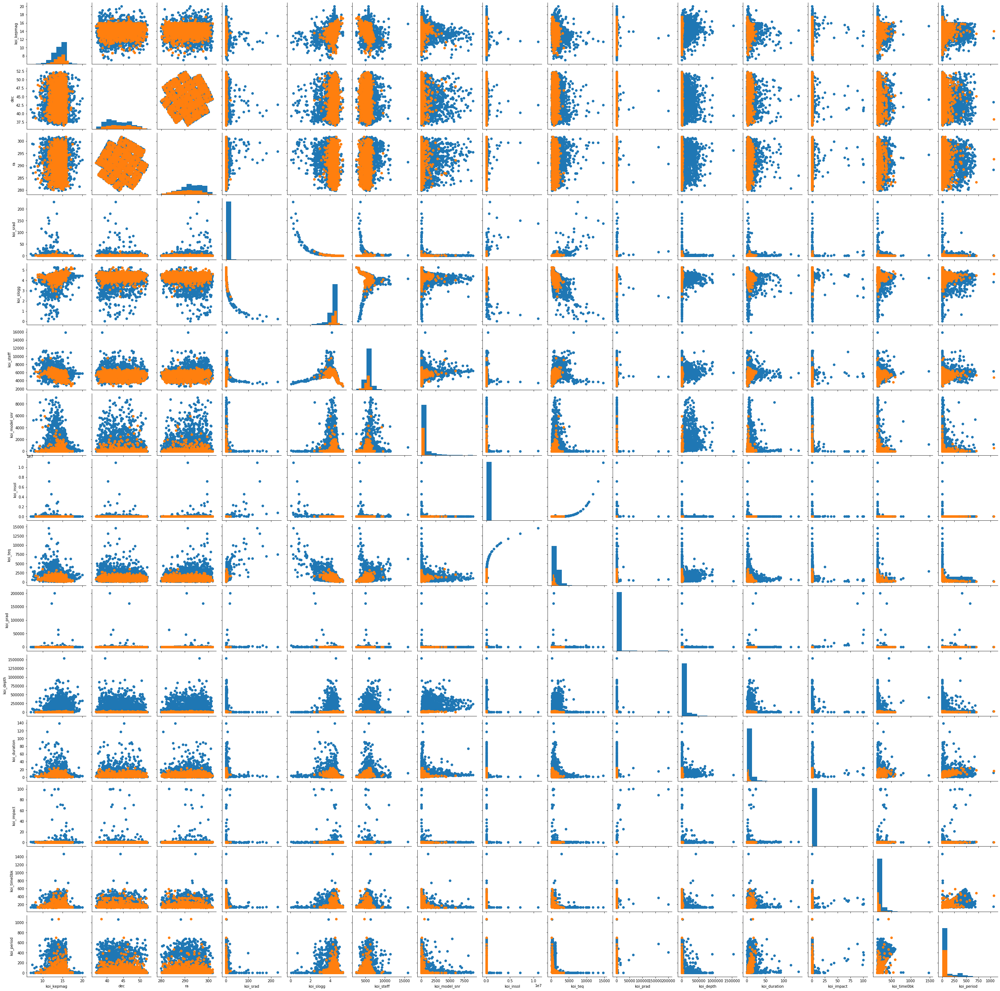

In [1]:
#code for pairplots
#g = sns.PairGrid(df, hue = 'Confirmed')
#g.map_diag(plt.hist)
#g.map_offdiag(plt.scatter);
from IPython.display import Image
Image(filename = 'pairplots.png')

In [13]:
#look at variance of variables
df.var()

Confirmed        2.185946e-01
koi_kepmag       1.993756e+00
dec              1.274531e+01
ra               2.258660e+01
koi_srad         4.037732e+01
koi_slogg        1.924511e-01
koi_steff        6.613143e+05
koi_model_snr    7.903372e+05
koi_insol        3.272219e+10
koi_teq          8.170571e+05
koi_prad         1.036964e+07
koi_depth        8.466731e+09
koi_duration     4.875803e+01
koi_impact       1.046238e+01
koi_time0bk      4.072422e+03
koi_period       1.297291e+04
dtype: float64

In [14]:
#get low variance variables
#could remove these later to reduce dimensionality
target = df['Confirmed']
numeric = df.drop(columns='Confirmed')
var = numeric.var()
numeric = numeric.columns
variable = [ ]
for i in range(0,len(var)-1):
    if var[i]>=1:   
       variable.append(numeric[i])

In [15]:
variable

['koi_kepmag',
 'dec',
 'ra',
 'koi_srad',
 'koi_steff',
 'koi_model_snr',
 'koi_insol',
 'koi_teq',
 'koi_prad',
 'koi_depth',
 'koi_duration',
 'koi_impact',
 'koi_time0bk']

In [16]:
#look at correlations
d = df.drop(columns='Confirmed')
cor = d.corr()
cor

,koi_kepmag,dec,ra,koi_srad,koi_slogg,koi_steff,koi_model_snr,koi_insol,koi_teq,koi_prad,koi_depth,koi_duration,koi_impact,koi_time0bk,koi_period
koi_kepmag,1.000000,0.019343,-0.003774,-0.167432,0.458354,-0.316073,-0.121788,-0.075080,-0.262190,-0.021157,0.051990,-0.097122,-0.008757,0.010347,-0.038878
dec,0.019343,1.000000,-0.008342,-0.027745,0.056420,-0.022297,0.004168,-0.015382,-0.056365,-0.003616,-0.014103,-0.028712,-0.011718,-0.015322,-0.003239
ra,-0.003774,-0.008342,1.000000,0.056984,-0.092861,0.108939,0.036769,0.029599,0.135015,0.003482,0.026162,0.036842,0.012769,-0.048609,-0.068232
koi_srad,-0.167432,-0.027745,0.056984,1.000000,-0.650933,-0.124206,-0.014585,0.579243,0.485279,0.058437,-0.021893,0.007743,0.021813,-0.012081,-0.000793
koi_slogg,0.458354,0.056420,-0.092861,-0.650933,1.000000,-0.126960,-0.047478,-0.315194,-0.567762,-0.096023,-0.005716,-0.112797,-0.054028,0.006059,-0.035337
koi_steff,-0.316073,-0.022297,0.108939,-0.124206,-0.126960,1.000000,0.151530,-0.066178,0.244907,-0.013311,0.120185,0.088089,0.018618,0.004846,0.024346
koi_model_snr,-0.121788,0.004168,0.036769,-0.014585,-0.047478,0.151530,1.000000,-0.012457,0.017578,-0.002562,0.568856,0.079955,-0.004479,-0.053807,-0.064201
koi_insol,-0.075080,-0.015382,0.029599,0.579243,-0.315194,-0.066178,-0.012457,1.000000,0.443474,0.003154,-0.010282,-0.020958,-0.004820,-0.023045,-0.023217
koi_teq,-0.262190,-0.056365,0.135015,0.485279,-0.567762,0.244907,0.017578,0.443474,1.000000,-0.002390,0.056693,-0.190722,-0.016436,-0.303542,-0.371265
koi_prad,-0.021157,-0.003616,0.003482,0.058437,-0.096023,-0.013311,-0.002562,0.003154,-0.002390,1.000000,0.002030,0.042690,0.679805,0.040525,0.074320


In [17]:
#get high correlation varaibles
#could remove these later to reduce dimensionality
cors = d.corr()
var = []
for i in cors.columns:
    for j in cors[i]:
        if  j >.5:   
           var.append([i,j])

In [18]:
var
# Correlated:
#koi_srad, koi_insol
#koi_model_snr, koi_depth
#koi_prad, koi_impact
#koi_period, koi_time0bk

[['koi_kepmag', 1.0],
 ['dec', 1.0],
 ['ra', 1.0],
 ['koi_srad', 1.0],
 ['koi_srad', 0.5792427390459053],
 ['koi_slogg', 1.0],
 ['koi_steff', 1.0],
 ['koi_model_snr', 1.0],
 ['koi_model_snr', 0.5688555529793039],
 ['koi_insol', 0.5792427390459053],
 ['koi_insol', 1.0],
 ['koi_teq', 1.0],
 ['koi_prad', 1.0],
 ['koi_prad', 0.6798050065040708],
 ['koi_depth', 0.5688555529793039],
 ['koi_depth', 1.0],
 ['koi_duration', 1.0],
 ['koi_impact', 0.6798050065040708],
 ['koi_impact', 1.0],
 ['koi_time0bk', 1.0],
 ['koi_time0bk', 0.6425860948584298],
 ['koi_period', 0.6425860948584298],
 ['koi_period', 1.0]]

# Training and Test Sets

In [19]:
#make training sets
X_train, X_test, y_train, y_test = train_test_split(d, target, test_size=0.2, random_state=9)

In [20]:
#do classifier to find feature importance
model = RandomForestClassifier(random_state=1, max_depth=10)
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=1, verbose=0, warm_start=False)

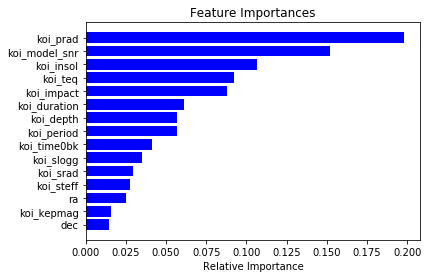

In [21]:
#plot feature importance
features = X_train.columns
importances = model.feature_importances_
indices = np.argsort(importances)[-15:]  # top 10 features
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Modeling

In [22]:
#Make Decision Trees
tre3 = tree.DecisionTreeClassifier(max_depth=7)
tre3.fit(X_train,y_train)
ypred3 = tre3.predict(X_test)

In [23]:
print("Accuracy:", metrics.accuracy_score(y_test, ypred3))

Accuracy: 0.8902097902097902


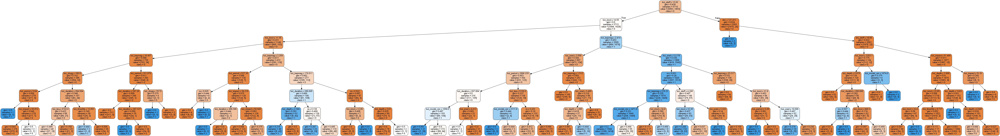

In [24]:
#Defining the feature names 
df_exo_x = ['koi_time0bk', 'koi_impact', 'koi_duration', 'koi_depth', 'koi_prad', 'koi_teq', 'koi_insol', 
            'koi_period', 'koi_model_snr', 'koi_steff', 'koi_slogg', 'koi_srad', 'ra', 'dec', 'koi_kepmag']
#Decision Tree Visualization
dot_data = StringIO()
export_graphviz(tre3, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = df_exo_x, class_names=['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('disposition2.png')
Image(graph.create_png())

In [25]:
tre4 = tree.DecisionTreeClassifier(max_depth=4)
tre4.fit(X_train,y_train)
ypred4 = tre4.predict(X_test)

In [26]:
print("Accuracy:", metrics.accuracy_score(y_test, ypred4))

Accuracy: 0.8685314685314686


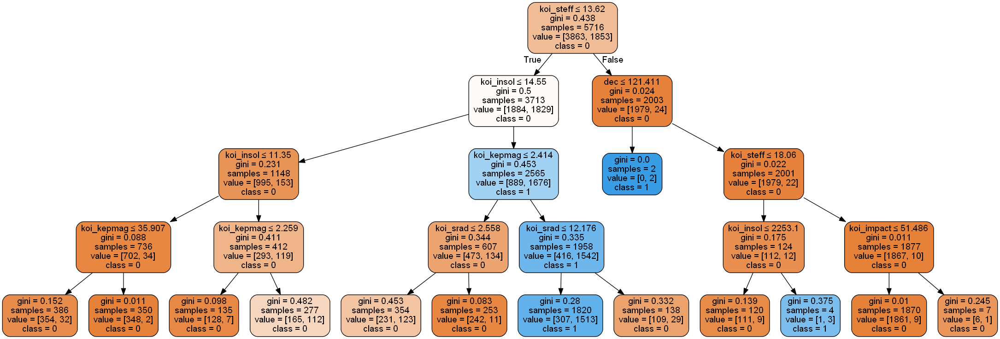

In [27]:
dot_data = StringIO()
export_graphviz(tre4, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = df_exo_x, class_names=['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('disposition2.png')
Image(graph.create_png())

In [28]:
#look at confusion matrices and hitrates
cm = confusion_matrix(y_test,ypred3)
hr_dt = (cm[0,0]+cm[1,1])/1430
mse_dt = mean_squared_error(y_test, ypred3)
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)
cm2 = confusion_matrix(y_test,ypred4)
print(cm2)
print('HitRate:', (cm2[0,0]+cm2[1,1])/1430)

[[899  78]
 [ 79 374]]
HitRate: 0.8902097902097902
[[887  90]
 [ 98 355]]
HitRate: 0.8685314685314686


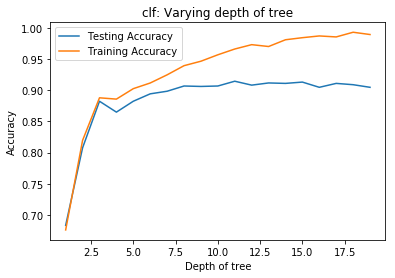

In [29]:
# Look at accuracies depending on depth for Random Forest

# Setup arrays to store train and test accuracies
dep = np.arange(1, 20)
train_accuracy = np.empty(len(dep))
test_accuracy = np.empty(len(dep))

# Loop over different values of k
for i, k in enumerate(dep):
    # Setup a k-NN Classifier with k neighbors: knn
    clf = RandomForestClassifier(max_depth=k)

    # Fit the classifier to the training data
    clf.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = clf.score(X_train, y_train)

    #Compute accuracy on the testing set
    test_accuracy[i] = clf.score(X_test, y_test)

# Generate plot
plt.title('clf: Varying depth of tree')
plt.plot(dep, test_accuracy, label = 'Testing Accuracy')
plt.plot(dep, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.xlabel('Depth of tree')
plt.ylabel('Accuracy')
plt.show()

In [30]:
#random forest models

model = RandomForestClassifier(n_estimators = 100,max_depth=13, bootstrap=True)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
# The mean squared error
mse = mean_squared_error(y_test, y_pred)
print('Mean squared error:', mse)

# The coefficient of determination: 1 is perfect prediction
r2 = r2_score(y_test, y_pred)
print('R-Squared:', r2)

cm= confusion_matrix(y_test,y_pred)
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)

Mean squared error: 0.08181818181818182
R-Squared: 0.6219675042534587
[[913  64]
 [ 53 400]]
HitRate: 0.9181818181818182


In [31]:
model = RandomForestClassifier(n_estimators = 100,max_depth=8, bootstrap=True)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
# The mean squared error
mse_rf = mean_squared_error(y_test, y_pred)
print('Mean squared error:', mse)

# The coefficient of determination: 1 is perfect prediction
r2 = r2_score(y_test, y_pred)
print('R-Squared:', r2)

cm= confusion_matrix(y_test,y_pred)
hr_rf = (cm[0,0]+cm[1,1])/1430
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)

Mean squared error: 0.08181818181818182
R-Squared: 0.5767328466427615
[[902  75]
 [ 56 397]]
HitRate: 0.9083916083916084


In [32]:
#logistic regression models

model = LogisticRegression().fit(preprocessing.scale(X_train),y_train)
y_pred = model.predict(preprocessing.scale(X_test))

mse_log = mean_squared_error(y_test, y_pred)
print('Mean squared error:', mse)

# The coefficient of determination: 1 is perfect prediction
r2 = r2_score(y_test, y_pred)
print('R-Squared:', r2)

cm= confusion_matrix(y_test,y_pred)
hr_log = (cm[0,0]+cm[1,1])/1430
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)

Mean squared error: 0.08181818181818182
R-Squared: 0.28593861914542207
[[842 135]
 [ 86 367]]
HitRate: 0.8454545454545455


## Compare Models

In [33]:
models = pd.DataFrame()
models['mod'] = ['Logistic','DicisionTree','RandomForest']
models['HitRate'] = [hr_log,hr_dt,hr_rf]
models['mse'] = [mse_log,mse_dt,mse_rf]

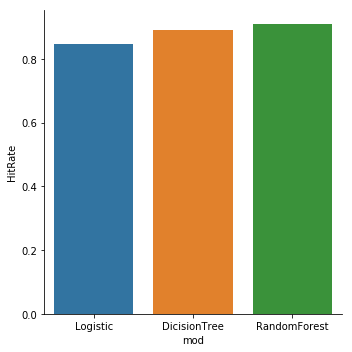

In [34]:
sns.catplot(x ='mod', y = 'HitRate', data = models, kind = 'bar')

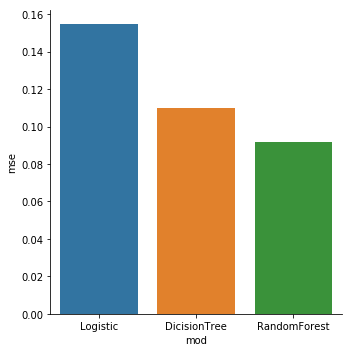

In [35]:
sns.catplot(x ='mod', y = 'mse', data = models, kind = 'bar')

# Fine Tuning

In [36]:
#Take out low varance varables
df2 = pd.concat([target,df[variable]],axis = 1)
d2 = df2.drop(columns='Confirmed')
X_train2, X_test2, y_train2, y_test2 = train_test_split(d2, df2['Confirmed'], test_size=0.2, random_state=9)

In [37]:
model = RandomForestClassifier(n_estimators = 100,max_depth=8, bootstrap=True)
model.fit(X_train2, y_train2)

y_pred = model.predict(X_test2)
# The mean squared error
mse = mean_squared_error(y_test2, y_pred)
print('Mean squared error:', mse)

# The coefficient of determination: 1 is perfect prediction
r2 = r2_score(y_test2, y_pred)
print('R-Squared:', r2)

cm= confusion_matrix(y_test2,y_pred)
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)

Mean squared error: 0.09300699300699301
R-Squared: 0.5702707526983761
[[901  76]
 [ 57 396]]
HitRate: 0.906993006993007


# Doesn't effect hitrate but reduces dimensionality and mse!

In [39]:
#remove multicollinearity:
#koi_srad, koi_insol 0.579
#koi_model_snr, koi_depth 0.56
#koi_prad, koi_impact 0.6798
d2.corr()

,koi_kepmag,dec,ra,koi_srad,koi_steff,koi_model_snr,koi_insol,koi_teq,koi_prad,koi_depth,koi_duration,koi_impact,koi_time0bk
koi_kepmag,1.000000,0.019343,-0.003774,-0.167432,-0.316073,-0.121788,-0.075080,-0.262190,-0.021157,0.051990,-0.097122,-0.008757,0.010347
dec,0.019343,1.000000,-0.008342,-0.027745,-0.022297,0.004168,-0.015382,-0.056365,-0.003616,-0.014103,-0.028712,-0.011718,-0.015322
ra,-0.003774,-0.008342,1.000000,0.056984,0.108939,0.036769,0.029599,0.135015,0.003482,0.026162,0.036842,0.012769,-0.048609
koi_srad,-0.167432,-0.027745,0.056984,1.000000,-0.124206,-0.014585,0.579243,0.485279,0.058437,-0.021893,0.007743,0.021813,-0.012081
koi_steff,-0.316073,-0.022297,0.108939,-0.124206,1.000000,0.151530,-0.066178,0.244907,-0.013311,0.120185,0.088089,0.018618,0.004846
koi_model_snr,-0.121788,0.004168,0.036769,-0.014585,0.151530,1.000000,-0.012457,0.017578,-0.002562,0.568856,0.079955,-0.004479,-0.053807
koi_insol,-0.075080,-0.015382,0.029599,0.579243,-0.066178,-0.012457,1.000000,0.443474,0.003154,-0.010282,-0.020958,-0.004820,-0.023045
koi_teq,-0.262190,-0.056365,0.135015,0.485279,0.244907,0.017578,0.443474,1.000000,-0.002390,0.056693,-0.190722,-0.016436,-0.303542
koi_prad,-0.021157,-0.003616,0.003482,0.058437,-0.013311,-0.002562,0.003154,-0.002390,1.000000,0.002030,0.042690,0.679805,0.040525
koi_depth,0.051990,-0.014103,0.026162,-0.021893,0.120185,0.568856,-0.010282,0.056693,0.002030,1.000000,0.062677,0.002787,-0.045881


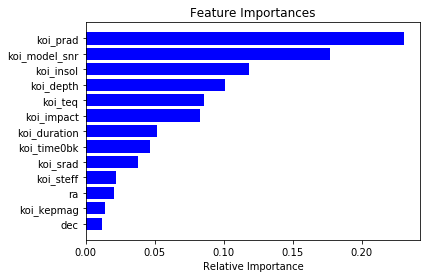

In [40]:
#plot feature importance
features = X_train2.columns
importances = model.feature_importances_
indices = np.argsort(importances)[-15:]  # top 10 features
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [41]:
#remove koi_impact because it has highest collinearity and lower feature
#importance than koi_prad

df3 = df2.drop(columns = 'koi_impact')
d3 = df3.drop(columns='Confirmed')
X_train3, X_test3, y_train3, y_test3 = train_test_split(d3, df3['Confirmed'], test_size=0.2, random_state=9)

# Final Model

In [42]:
model_final = RandomForestClassifier(n_estimators = 100,max_depth=8, bootstrap=True)
model_final.fit(X_train3, y_train3)

y_pred = model_final.predict(X_test3)
# The mean squared error
mse = mean_squared_error(y_test3, y_pred)
print('Mean squared error:', mse)

# The coefficient of determination: 1 is perfect prediction
r2 = r2_score(y_test3, y_pred)
print('R-Squared:', r2)

cm= confusion_matrix(y_test3,y_pred)
print(cm)
print('HitRate:', (cm[0,0]+cm[1,1])/1430)

Mean squared error: 0.0972027972027972
R-Squared: 0.5508844708652202
[[899  78]
 [ 61 392]]
HitRate: 0.9027972027972028


# Reduced Hit-Rate a little, but worth it to reduce multicollinearity

In [44]:
def plot_confusion_matrix(cm, classes, title='Confusion matrix CM1', cmap=plt.cm.Purples):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.

    plt.tight_layout()
    plt.ylabel('True')
    plt.xlabel('Predicted')

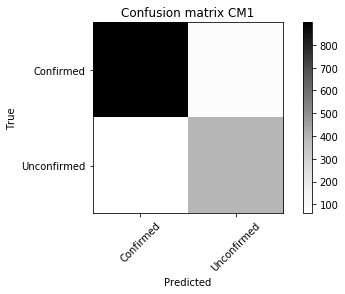

In [45]:
plot_confusion_matrix(cm, classes=["Confirmed", "Unconfirmed"], cmap=plt.cm.Greys)
plt.show()

In [46]:

estimator = model_final.estimators_[1]

#from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_test3.columns,
                class_names = ['0','1'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# Final Variables
##### 12 Variables In the Final Model
1.) koi_kepmag - K-band mag from 2MASS - basically a complex formula used to determine or help determine planets flux

2.) dec - KIC Declination

3.) ra - KIC Right Ascension

4.) koi_srad - The photospheric radius of the star

5.) koi_steff - The photospheric temperature of the star.

6.) koi_model_snr - Transit depth normalized by the mean uncertainty in the flux during the transits. (the energy a planet receives per second)

7.) koi_insol -Insolation flux is another way to give the equilibrium temperature.

8.) koi_teq - Approximation for the temperature of the planet.

9.) koi_prad - The radius of the planet. Planetary radius is the product of the planet star radius ratio and the stellar radius.

10.) koi_depth - The fraction of stellar flux lost at the minimum of the planetary transit.

11.) koi_duration - The duration of the observed transits.

12.) koi_time0bk - The time corresponding to the center of the first detected transit in Barycentric Julian Day (BJD) minus a constant offset of 2,454,833.0 days

# Interesting Facts / Lessons Learned

#### Assumptions
Thought there would be more multicolinearity
#### What did work
Random forest worked

Removing low variance variables

Decent model after removing flag and error variables

#### What didn't work
Logistic Regression and Decision Tree when compared to Random Forest

A lot of debugging issues involving packages

Hard to graph raw data because of large amount of variables
#### Surprises
Flux or the energy the planet receives from their star per second, was an important variable

Surprised on how well Random Forest works for the model

# References

exoplanets.nasa.gov/exep/

exoplanetarchive.ipac.caltech.edu/docs/API_kepcandidate_columns.html#pdisposition